# Tarea 2: Filtros usando Fourier

La función Filtro se basa en gran parte en el código de: https://medium.com/@osah.dilshan/applying-fourier-transform-to-images-for-patterned-noise-removal-b543f99f61db

In [ ]:
# cargamos las librerías

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.image import imread
from   matplotlib.colors import LogNorm
from   scipy.fftpack     import fft2,ifft2,fftshift,ifftshift
from   scipy.ndimage     import gaussian_filter
from   scipy.signal      import fftconvolve

In [ ]:
!wget https://www.dropbox.com/scl/fi/o6ir8pjfq3rxbmud8vw5g/2024-FotosTareas02.zip?rlkey=w0b1thyk0kw7ndq93go5jwzvv&e=2&st=bo6rjs7v
!unzip /content/2024-FotosTareas02.zip?rlkey=w0b1thyk0kw7ndq93go5jwzvv&e=2&st=bo6rjs7v
!ls

--2024-10-17 17:22:56--  https://www.dropbox.com/scl/fi/o6ir8pjfq3rxbmud8vw5g/2024-FotosTareas02.zip?rlkey=w0b1thyk0kw7ndq93go5jwzvv
Resolving www.dropbox.com (www.dropbox.com)... 162.125.2.18, 2620:100:6016:18::a27d:112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.2.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://uc8f276d339103b941791306c9f3.dl.dropboxusercontent.com/cd/0/inline/CcpKPvzFnFGHnfS-TxYsyvaqNGCjj92fl417T697XbujaNBet-MVJ3JzKnSj3dTn-6J2a1qjvonOC-_nkchBHccjovN3akdyNCyHYAhu6FC87rOqseE0T_NGbEbOXEfe2tM/file# [following]
--2024-10-17 17:22:57--  https://uc8f276d339103b941791306c9f3.dl.dropboxusercontent.com/cd/0/inline/CcpKPvzFnFGHnfS-TxYsyvaqNGCjj92fl417T697XbujaNBet-MVJ3JzKnSj3dTn-6J2a1qjvonOC-_nkchBHccjovN3akdyNCyHYAhu6FC87rOqseE0T_NGbEbOXEfe2tM/file
Resolving uc8f276d339103b941791306c9f3.dl.dropboxusercontent.com (uc8f276d339103b941791306c9f3.dl.dropboxusercontent.com)... 162.125.1.15, 2620:100:6016:15::a27d:10f
Connecting 

# Código y funciones principales:

A continuación las funciones que se ocuparán en el código para procesar cada imagen

In [ ]:
def gauss_2d(x, y, mu_x, mu_y, sigma):
    """
    Función del filtro gaussiano 2D.
    Esta la usaremos en las máscaras de cada punto.
    """
    return np.exp(-((x - mu_x)**2 + (y - mu_y)**2) / (2.0 * sigma**2))

def reflejar_puntos(centers, N, M):
    """
    Función para reflejar puntos respecto al centro.
    Esto es porque el ruido es periódico.
    No funcionó tan bien, debido a la rotación de la simetría de las frecuencias.
    """
    reflejados = []
    for center in centers:
        cx, cy = center
        reflejados.append([N - cx, cy]) # Reflejo horizontal
        reflejados.append([cx, M - cy]) # Reflejo vertical
        reflejados.append([N - cx, M - cy]) # Reflejo diagonal (ambos ejes)
    return centers + reflejados

In [ ]:
def distance(point1,point2):
    return np.sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)

def gaussianLP(D0,imgShape):
    """
    Usaremos esta función para suavizar la imagen como post-procesamiento.
    """
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = np.exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

Do     = 80 # stop frequency

In [ ]:
def Filtro(img, fshift_img, puntos, sigma, cruz=10):
    """
    Aplica un filtro gaussiano a la imagen en cada punto,
    añadiendo pequeños segmentos a los costados del círculo de tamaño cruz.
    """
    # Hacemos una máscara de la imagen
    N, M = img.shape
    mask = np.ones((N, M), np.float32)

    y, x = np.ogrid[:N, :M]
    centers = reflejar_puntos(puntos, N, M)  # obtenemos los puntos reflejados

    for center in centers:
        gaussian_mask = gauss_2d(x, y, center[1], center[0], sigma)
        mask *= (1 - gaussian_mask)  # Restar la gaussiana de la máscara

        # Añadimos un pequeño segmento a cada lado del círculo
        mask[max(0, center[0] - cruz):center[0], center[1]] = 0 # añadimos esto para tratar de tapar un poco del halo del punto
        mask[center[0]:min(N, center[0] + cruz), center[1]] = 0
        mask[center[0], max(0, center[1] - cruz):center[1]] = 0
        mask[center[0], center[1]:min(M, center[1] + cruz)] = 0

    fshift_img_mask = fshift_img * mask  # Aplicamos la máscara

    return fshift_img_mask


In [ ]:
def FiltroRuidoPeriodico(img, puntos, sigma, pad_width):
    """
    Esta función mezcla el resto de funciones para procesar por completo la imagen.
    Aplica la transformada de Fourier, el Filtro y luego la transformada inversa.
    """
    plt.figure(figsize=(30,15))
    plt.subplot(231), plt.imshow(img, "gray"), plt.title("Imagen original")

    img_padded = np.pad(img, pad_width=((pad_width, pad_width), (pad_width, pad_width)), mode='edge') # edge repite los valores del borde original
    plt.subplot(232), plt.imshow(img_padded, "gray"), plt.title("Imagen con margen")

    # Pasamos la imagen a Fourier
    ft_img = np.fft.fft2(img_padded)
    fshift_img = np.fft.fftshift(ft_img)  # Centramos las frecuencias bajas al centro
    mI_ft = 20 * np.log(np.abs(fshift_img))
    plt.subplot(233), plt.imshow(mI_ft, "gray"), plt.title("Spectro original")
    plt.colorbar()

    fshift_img_mask = Filtro(img_padded, fshift_img, puntos, sigma) # aplicamos el filtro gaussiano

    mI_ft_masc = 20 * np.log(np.abs(fshift_img_mask) + 1)
    plt.subplot(234), plt.imshow(mI_ft_masc, "gray"), plt.title("Espectro con máscara")
    plt.colorbar()

    f_ishift = np.fft.ifftshift(fshift_img_mask)  # Volvemos a centrar las frecuencias bajas

    H = gaussianLP(Do,img_padded.shape) # gauss low pass
    H_c = fftshift(H)
    Y2_ft = f_ishift * H_c # aplicamos la máscara low pass a el espectro recortado con las gaussianas puntuales

    img_back = np.fft.ifft2(Y2_ft)  # Aplicamos la inversa de Fourier

    img_back = np.abs(img_back)  # Volvemos a la imagen real
    plt.subplot(235), plt.imshow(np.abs(img_back), "gray"), plt.title("Imagen procesada")

    img_recortada = img_back[pad_width:-pad_width, pad_width:-pad_width] # recortamos el pad
    plt.subplot(236), plt.imshow(img_recortada, "gray"), plt.title("Imagen recortada")

    plt.show()

    return img_back

In [ ]:
def ajustar_puntos(puntos, pad_width):
    """
    agregamos el padding correspondiente a los puntos, ya que estos fueron encontrados sin el pad.
    """
    nuevos_puntos = []
    for punto in puntos:
       punto = punto[0] + pad_width, punto[1] + pad_width
       nuevos_puntos.append(punto)
    return nuevos_puntos

Cargamos las imágenes a continuación:

In [ ]:
# graficamos una imagen a ver qué tal
img_1 = imread('J1.png')
img_2 = imread('J2.png')
img_3 = imread('J3.png')
img_4 = imread('J4.png')
img_5 = imread('J5.png')

# Visualización de imagen por imagen:

Aquí al reemplazar img por valores del 1 al 5 se reemplazarán automáticamente los parámetros de cada imagen y se podrá correr el código para visualizar estas, de forma que es más automático el proceso.

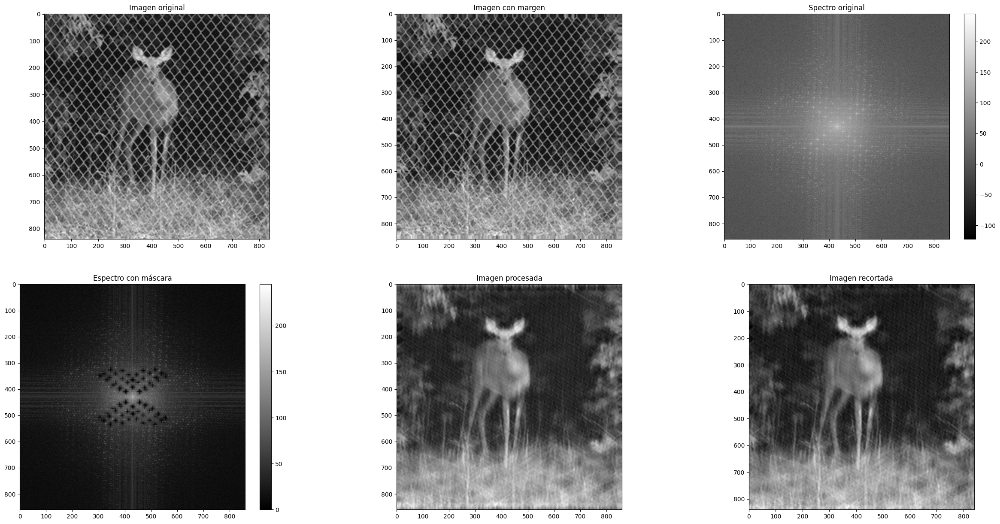

In [ ]:
# Para correr el algoritmo automáticamente con todos los parámetros y hacer más
# simple la visualización tenemos estas librerías:

imagenes = {
    1: {
        "puntos": [(337, 362), (367, 405), (390, 355), (422, 397), (365, 225), (253, 323), (233, 380),
                   (310, 500), (395, 530), (505, 435), (525, 375), (445, 255), (400, 150)],
        "sigma": 7,
        "img_data": img_1
    },
    2: {
        "puntos": [(385, 355), (372, 400), (368, 380), (390, 384), (290, 345), (470, 420)],
        "sigma": 5,
        "img_data": img_2
    },
    3: {
        "puntos": [(405, 338), (350, 364), (358, 423), (410, 395), (225, 297), (435, 255),
                   (449, 220), (323, 503)],
        "sigma": 7,
        "img_data": img_3
    },
    4: {
        "puntos": [(365, 330), (355, 387), (395, 426), (402, 375)],
        "sigma": 8,
        "img_data": img_4
    },
    5: {
        "puntos": [(400, 395), (385, 375), (367, 355), (346, 331), (330, 310), (500, 295), (485, 322),
                   (465, 345), (450, 370), (440, 393), (383, 420), (365, 400), (350, 380), (355, 422),
                   (315, 335), (330, 355), (335, 405), (320, 380)],
        "sigma": 8,
        "img_data": img_5
    }
}

img = 5  # Cambiar este valor para seleccionar la imagen (de 1 a 5)
pad_width = 10
parametros = imagenes[img] # llamamos los valores de la librería

nuevos_puntos = ajustar_puntos(parametros["puntos"], pad_width)

# Aplicar el filtro
img_filtrada = FiltroRuidoPeriodico(parametros["img_data"], nuevos_puntos, parametros["sigma"], pad_width)


#

# Visualización de cada imagen:

A continuación la visualización de todas las imágenes, una tras otra con sus parámetros, por si se prefiere visualizarlas todas a la vez:

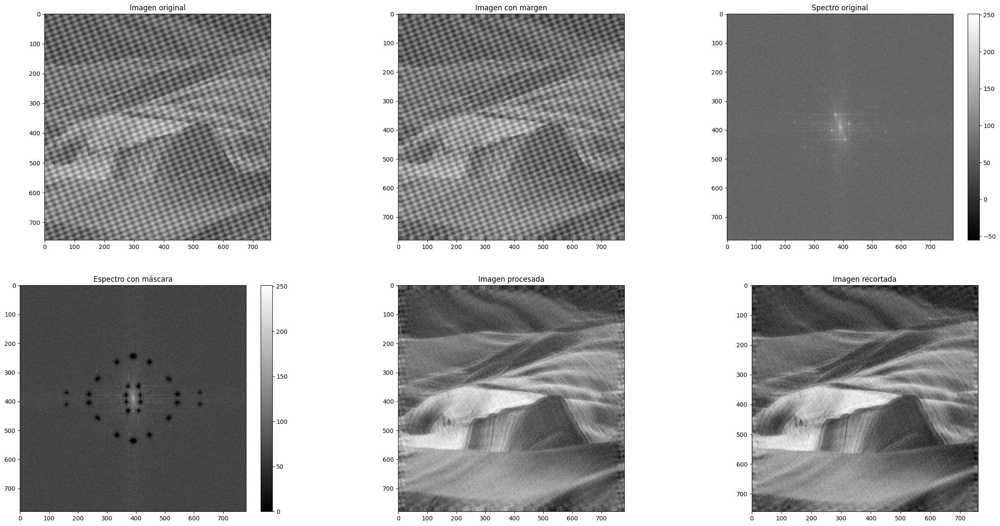

In [ ]:
puntos = [(337, 362), (367, 405), (390, 355), (422, 397), (365, 225), (253, 323), (233, 380), (310, 500), (395, 530), (505, 435), (525, 375), (445, 255), (400, 150)]
# sigma=7
# pad_width = 10

# nuevos_puntos = ajustar_puntos(puntos, pad_width)

# img_filtrada = FiltroRuidoPeriodico2(img_1, nuevos_puntos, sigma, pad_width)
#  img_filtrada = FiltroRuidoPeriodico(img_1, nuevos_puntos, sigma, pad_width)

sigma=7
pad_width = 10

nuevos_puntos = ajustar_puntos(puntos, pad_width)
img_filtrada = FiltroRuidoPeriodico(img_1, nuevos_puntos, sigma, pad_width)


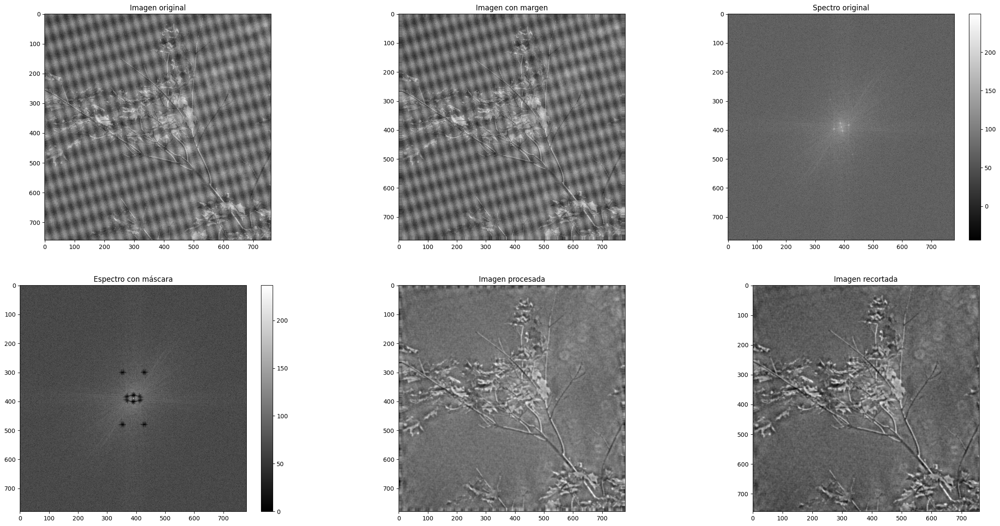

In [ ]:
puntos = [(385, 355), (372, 400), (368, 380), (390, 384), (290, 345), (470, 420)]
sigma=5

pad_width = 10
nuevos_puntos = ajustar_puntos(puntos, pad_width)

# img_filtrada = FiltroRuidoPeriodico2(img_2, nuevos_puntos, sigma, pad_width)
img_filtrada = FiltroRuidoPeriodico(img_2, nuevos_puntos, sigma, pad_width)


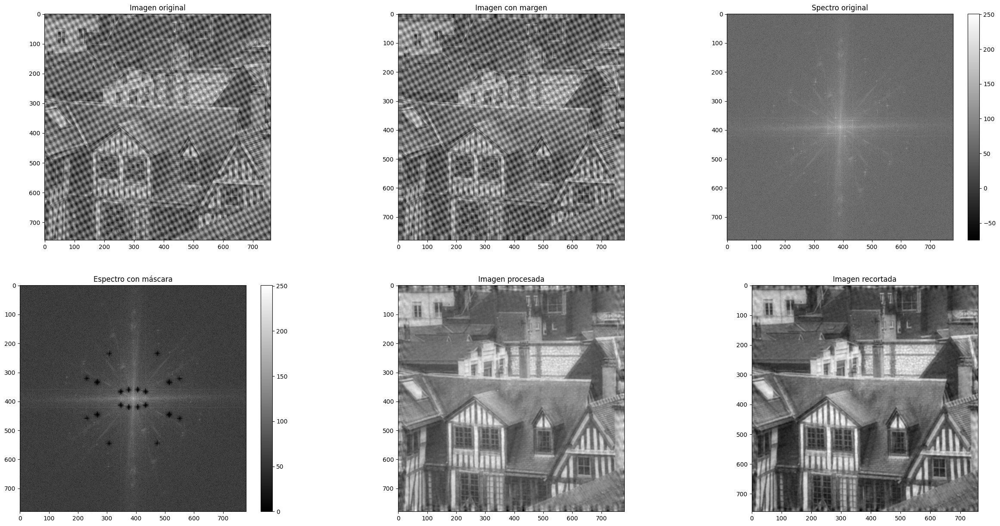

In [ ]:
# Lista de puntos que deseas eliminar, por ejemplo:
puntos = [(405, 338), (350, 364), (358, 423), (410, 395), (225, 297), (435, 255), (449, 220), (323, 503)]
sigma=7

pad_width = 10
nuevos_puntos = ajustar_puntos(puntos, pad_width)

img_filtrada = FiltroRuidoPeriodico(img_3, nuevos_puntos, sigma, pad_width)


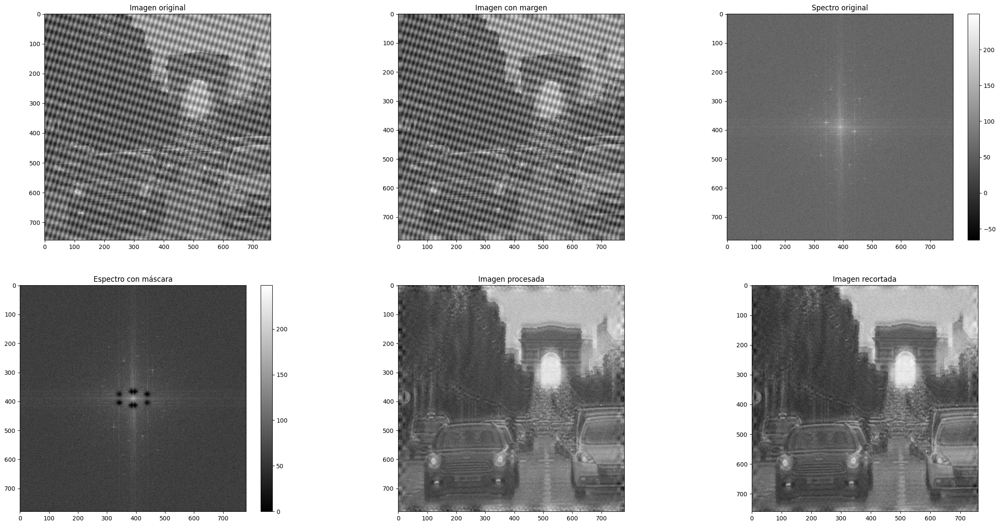

In [ ]:
# Lista de puntos que deseas eliminar, por ejemplo:
puntos = [(365, 330), (355, 387), (395, 426), (402, 375)]
sigma=8

pad_width = 10
nuevos_puntos = ajustar_puntos(puntos, pad_width)

img_filtrada = FiltroRuidoPeriodico(img_4, nuevos_puntos, sigma, pad_width)


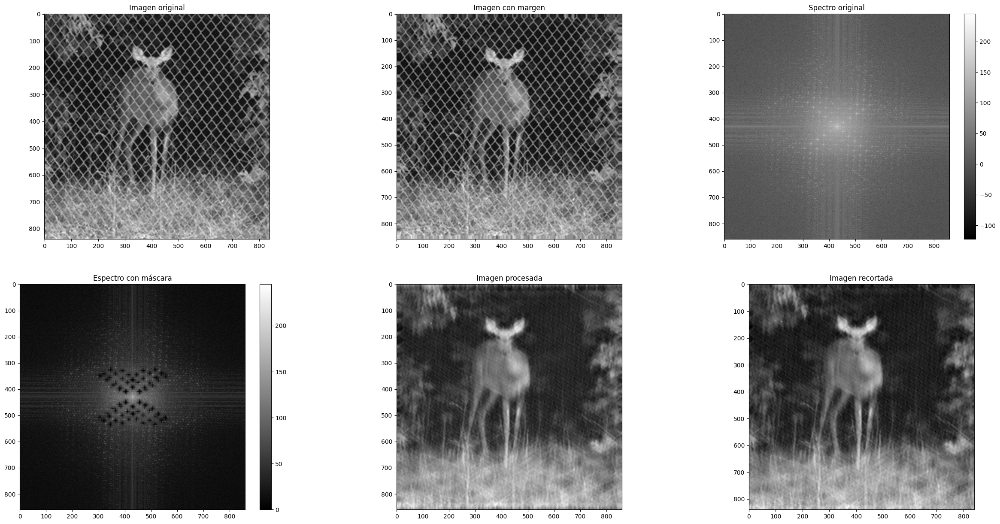

In [ ]:
# Lista de puntos que deseas eliminar, por ejemplo:
puntos = [(400, 395), (385, 375), (367, 355), (346, 331), (330, 310), (500, 295), (485, 322), (465, 345), (450, 370), (440, 393), (383, 420), (365, 400), (350, 380), (355, 422), (315, 335), (330, 355), (335, 405), (320, 380)]
sigma=8

pad_width = 10
nuevos_puntos = ajustar_puntos(puntos, pad_width)

img_filtrada = FiltroRuidoPeriodico(img_5, nuevos_puntos, sigma, pad_width)

#Funciones utilizadas con anterioridad:

El profesor dijo que podíamos incluir algunos intentos hechos al final del código para ver mostrar cosas que se probaron.

In [ ]:
def FiltroRuidoPeriodico2(img, puntos, sigma, pad_width):
    """
    La función de FiltroRuidoPeriodico, pero sin el filtro gaussiano post-procesamiento.
    Esta es solo para comparación. La imagen queda con mejor calidad, pero menor contraste y algo más de ruido.
    """
    plt.figure(figsize=(30,15))
    plt.subplot(231), plt.imshow(img, "gray"), plt.title("Imagen original")

    img_padded = np.pad(img, pad_width=((pad_width, pad_width), (pad_width, pad_width)), mode='edge')
#    plt.subplot(232), plt.imshow(img_padded, "gray"), plt.title("Imagen con margen")

    # Pasamos la imagen a Fourier
    ft_img = np.fft.fft2(img_padded)
    fshift_img = np.fft.fftshift(ft_img)  # Centramos las frecuencias bajas al centro
    mI_ft = 20 * np.log(np.abs(fshift_img))
#    plt.subplot(233), plt.imshow(mI_ft, "gray"), plt.title("Spectro original")
#    plt.colorbar()

    fshift_img_mask = Filtro(img_padded, fshift_img, puntos, sigma)

    mI_ft_masc = 20 * np.log(np.abs(fshift_img_mask) + 1)
 #   plt.subplot(234), plt.imshow(mI_ft_masc, "gray"), plt.title("Espectro con máscara")
 #   plt.colorbar()

    # Transformada inversa para obtener la imagen filtrada
    f_ishift = np.fft.ifftshift(fshift_img_mask)  # Volvemos a centrar las frecuencias bajas #

    H = gaussianLP(Do,img_padded.shape)
    H_c = fftshift(H)
    Y2_ft = f_ishift * H_c

    img_back = np.fft.ifft2(fshift_img_mask)  # Aplicamos la inversa de Fourier

    img_back = np.abs(img_back)  # Volvemos a la imagen real
    plt.subplot(235), plt.imshow(np.abs(img_back), "gray"), plt.title("Processed Image")

    img_recortada = img_back[pad_width:-pad_width, pad_width:-pad_width]
    plt.subplot(236), plt.imshow(img_recortada, "gray"), plt.title("Imagen recortada")

    plt.show()

    return img_back

In [ ]:
def FiltroRuidoPeriodicoGaussiano(img, puntos, sigma):
    """
    Esta función es como las anteriores, pero sin la reflexión de puntos,
    para visualizar mejor los puntos originales.
    """
    plt.figure(figsize=(30,15))
    plt.subplot(231), plt.imshow(img, "gray"), plt.title("Imagen original")

    # Pasamos la imagen a Fourier
    ft_img = np.fft.fft2(img)
    fshift_img = np.fft.fftshift(ft_img)  # Centramos las frecuencias bajas al centro
    mI_ft = 20 * np.log(np.abs(fshift_img))
    plt.subplot(232), plt.imshow(mI_ft, "gray"), plt.title("Spectro original")
    plt.colorbar()

    # Hacemos una máscara de la imagen
    N, M = img.shape
    mask = np.ones((N, M), np.float32)

    y, x = np.ogrid[:N, :M]

    # Puntos a eliminar
    for punto in puntos:
        gaussian_mask = gauss_2d(x, y, punto[1], punto[0], sigma)
        mask *= (1 - gaussian_mask)  # Restar la gaussiana de la máscara
    # Aplicamos la máscara al espectro
    fshift_img_mask = fshift_img * mask  # Aplicamos la máscara
    mI_ft_masc = 20 * np.log(np.abs(fshift_img_mask) + 1)

    plt.subplot(233), plt.imshow(mI_ft_masc, "gray"), plt.title("Espectro con máscara")
    plt.colorbar()

    # Transformada inversa para obtener la imagen filtrada
    f_ishift = np.fft.ifftshift(fshift_img_mask)  # Volvemos a centrar las frecuencias bajas
    plt.subplot(234), plt.imshow(np.log(1+np.abs(f_ishift)), "gray"), plt.title("nuevo espectro")
    plt.colorbar()

    img_back = np.fft.ifft2(f_ishift)  # Aplicamos la inversa de Fourier
    plt.subplot(235), plt.imshow(np.abs(img_back), "gray"), plt.title("Imagen procesada")

    img_back = np.abs(img_back)  # Volvemos a la imagen real
    plt.subplot(236), plt.imshow(np.abs(img_back), "gray"), plt.title("Processed Image final")
    plt.show()

    return img_back